# Deep Neural Networks Project - Image Colorization
**Maria Kostopoulou**

**Kostas Panoutsakos**

**Konstantina Stoikou**


## Import libraries

In [ ]:
from google.colab import drive
drive.mount("/content/drive/")

Mounted at /content/drive/


In [ ]:
import os
import glob 
import numpy as np
import pickle
import skimage
from skimage import io
from skimage.transform import resize
from skimage.color import rgb2lab, lab2rgb, rgb2gray, gray2rgb
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
import keras
from keras.models import Sequential, Model
from keras.layers import Activation, Dense, Dropout, Flatten, Conv2D, Conv3D, UpSampling2D, InputLayer, Conv2DTranspose, Input, Reshape
from keras.utils.vis_utils import plot_model
from keras.applications.vgg16 import VGG16
import matplotlib.pyplot as plt  
%matplotlib inline

## Load images

In [ ]:
dataset_path = '/content/drive/MyDrive/Landscape'

imgs = []

for image in sorted(os.listdir(dataset_path)):
    imgs.append(io.imread(os.path.join(dataset_path, image)))

len(imgs)

2000

## Explore the dataset

### Display first 3 images of the dataset

(150, 150, 3)


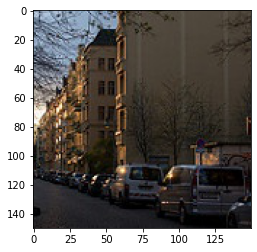

(150, 150, 3)


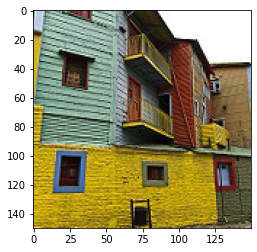

(150, 150, 3)


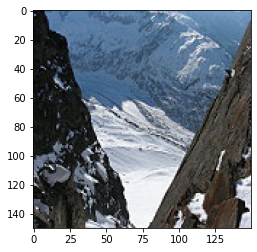

In [ ]:
for img in imgs[:3]:
    print(img.shape) 
    plt.imshow(img)
    plt.show()

### Check which images don't have dimensions 150x150

(134, 150, 3)


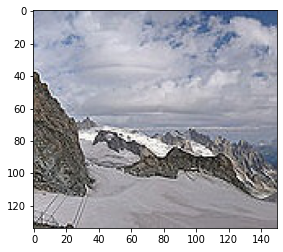

(76, 150, 3)


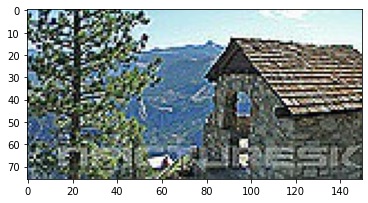

(140, 150, 3)


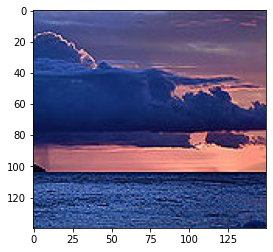

(113, 150, 3)


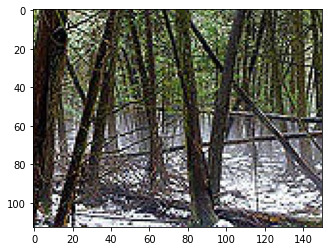

(110, 150, 3)


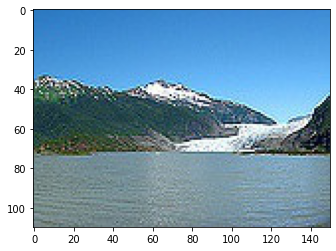

In [ ]:
for img in imgs:
    if img.shape[0] != 150 or img.shape[1] != 150:
        print(img.shape) 
        plt.imshow(img)
        plt.show()

### Display same images but normalized

(150, 150, 3)


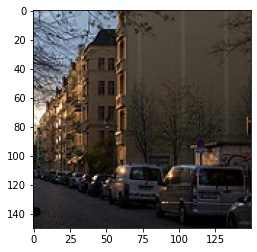

(150, 150, 3)


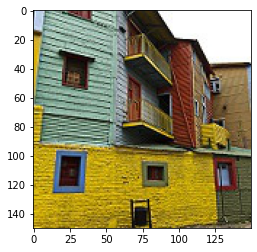

(150, 150, 3)


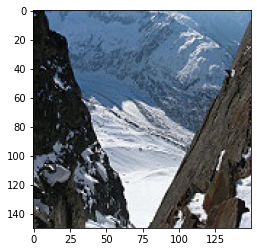

In [ ]:
for img in imgs[:3]:
    img = 1.0/255 * img
    print(img.shape) 
    plt.imshow(img)
    plt.show()

### Display same images but resized to 256x256

(256, 256, 3)


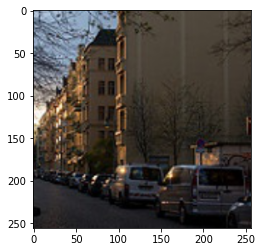

(256, 256, 3)


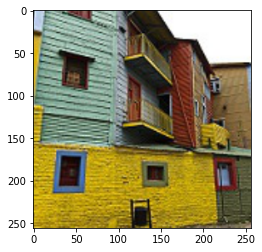

(256, 256, 3)


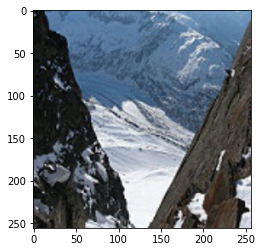

In [ ]:
for img in imgs[:3]:
    img = resize(img, (256, 256))
    print(img.shape) 
    plt.imshow(img)
    plt.show()

### Display the RGB channels of the same images


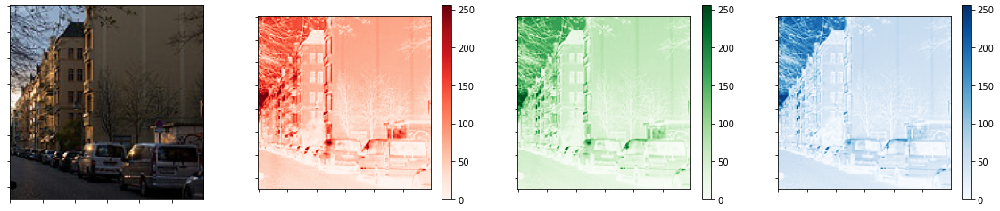

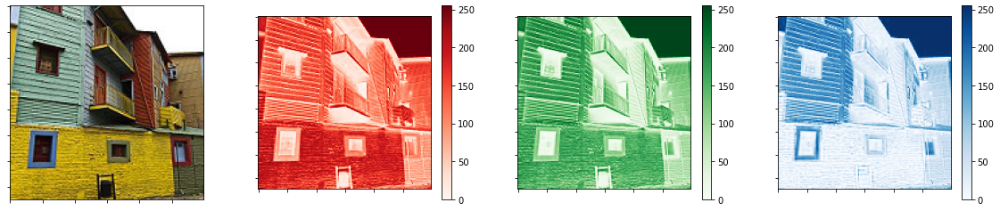

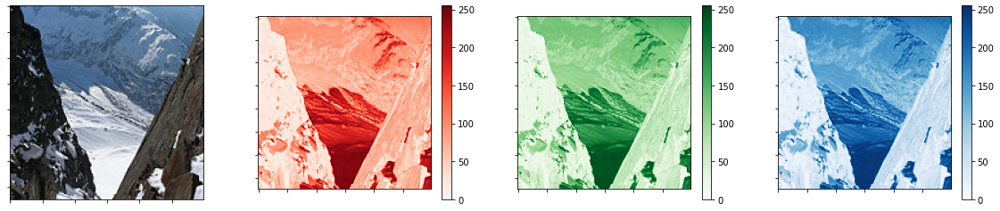

In [ ]:
for img in imgs[:3]:
    red = img[:, :, 0]
    green = img[:, :, 1]
    blue = img[:, :, 2]

    fig, axs = plt.subplots(1,4)
    fig.set_figwidth(20) 

    cax_0 = axs[0].imshow(img)
    axs[0].xaxis.set_major_formatter(plt.NullFormatter())  # kill xlabels
    axs[0].yaxis.set_major_formatter(plt.NullFormatter())  # kill ylabels

    cax_1 = axs[1].imshow(red, cmap='Reds')
    fig.colorbar(cax_1, ax=axs[1])
    axs[1].xaxis.set_major_formatter(plt.NullFormatter())
    axs[1].yaxis.set_major_formatter(plt.NullFormatter())

    cax_2 = axs[2].imshow(green, cmap='Greens')
    fig.colorbar(cax_2, ax=axs[2])
    axs[2].xaxis.set_major_formatter(plt.NullFormatter())
    axs[2].yaxis.set_major_formatter(plt.NullFormatter())

    cax_3 = axs[3].imshow(blue, cmap='Blues')
    fig.colorbar(cax_3, ax=axs[3])
    axs[3].xaxis.set_major_formatter(plt.NullFormatter())
    axs[3].yaxis.set_major_formatter(plt.NullFormatter())
    plt.show()

### Display same images in grayscale

(150, 150)


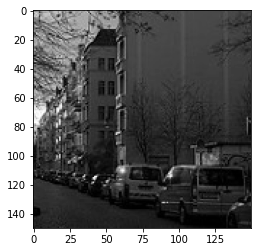

(150, 150)


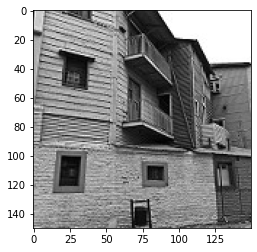

(150, 150)


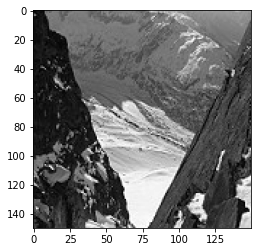

In [ ]:
for img in imgs[:3]:
    gray_image = rgb2gray(img)
    print(gray_image.shape) 
    plt.imshow(gray_image, cmap = 'gray')
    plt.show()

### Display same images in the LAB color space

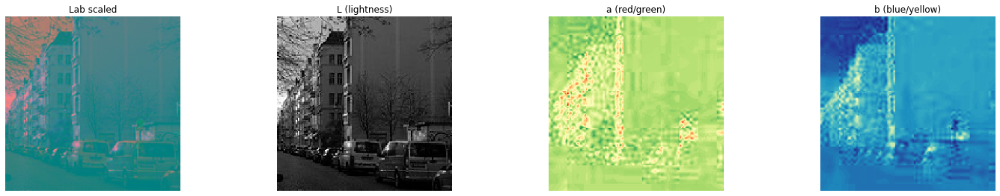

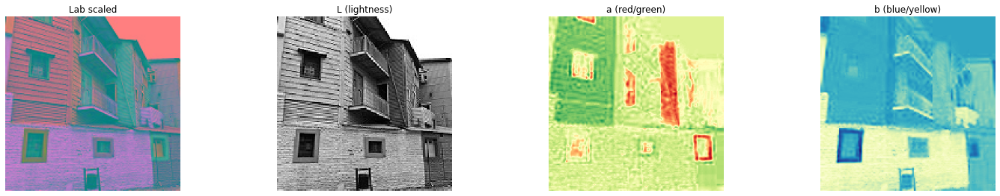

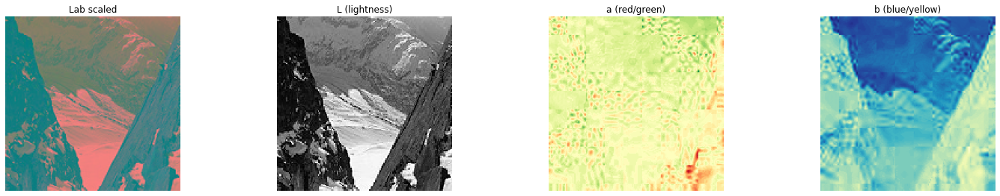

In [ ]:
for img in imgs[:3]:
    img = rgb2lab(img / 255)
    img = (img + [0, 128, 128]) / [100, 255, 255]
    
    fig, ax = plt.subplots(1, 4)
    fig.set_figwidth(20)
    ax[0].imshow(img) 
    ax[0].axis('off')
    ax[0].set_title('Lab scaled')
    io.imshow(img[:,:,0], ax=ax[1]) 
    ax[1].axis('off')
    ax[1].set_title('L (lightness)')
    ax[2].imshow(img[:,:,1], cmap='RdYlGn_r') 
    ax[2].axis('off')
    ax[2].set_title('a (red/green)')
    ax[3].imshow(img[:,:,2], cmap='YlGnBu_r') 
    ax[3].axis('off')
    ax[3].set_title('b (blue/yellow)')
        
    plt.show()

## Preprocess images and tranform to LAB color space

We transform the images to the LAB color space. We put the L channel of each image in the vector X and the ab channels in the vector Y. We divide Y by 128 because the range of the values of the ab channel is between -127 and 128. We normalize the values so they end up being between -1 and 1. This X=X.reshape(X.shape+(1,)) is added because we want the dimensions of X and Y to be the same.

In [ ]:
def preprocess(img, resized_dim):
    # normalize image
    img = 1.0/255 * img
    # resize image
    img = resize(img, (resized_dim, resized_dim))

    return img

In [ ]:
X =[]
Y =[]
for img in imgs:
    img = preprocess(img, 256)
    lab = rgb2lab(img)
    X.append(lab[:,:,0])
    # A and B values range from -127 to 128, 
    # so we divide the values by 128 to restrict values to between -1 and 1
    Y.append(lab[:,:,1:] / 128)

X = np.array(X)
Y = np.array(Y)
X = X.reshape(X.shape + (1,)) # dimensions to be the same for X and Y
print(X.shape)
print(Y.shape)

(2000, 256, 256, 1)
(2000, 256, 256, 2)


## Split train and test dataset

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.025, random_state=17)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1950, 256, 256, 1),
 (50, 256, 256, 1),
 (1950, 256, 256, 2),
 (50, 256, 256, 2))

OPTIONAL: Save original test images to a folder

In [ ]:
save_path = '/content/drive/MyDrive/imagesBaseline/original/'

# Output colorizations
for i in range(len(X_test)):
    result = np.zeros((256, 256, 3))
    result[:,:,0] = X_test[i][:,:,0]
    result[:,:,1:] = y_test[i] * 128
    result = lab2rgb(result)
    # plt.imshow(result)
    # plt.show()
    io.imsave(save_path + 'image' + str(i) + '.png', result)

## Baseline Autoencoder model

### Define and compile autoencoder model.

In [ ]:
# Encoder
encoder_input = Input(shape=(256, 256, 1,))
encoder_input = Dropout(0.2)(encoder_input)
encoder_output = Conv2D(64, (3,3), activation='relu', padding='same', strides=2)(encoder_input)
encoder_output = Conv2D(128, (3,3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(128, (3,3), activation='relu', padding='same', strides=2)(encoder_output)
encoder_output = Dropout(0.2)(encoder_output)
encoder_output = Conv2D(256, (3,3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(256, (3,3), activation='relu', padding='same', strides=2)(encoder_output)
encoder_output = Dropout(0.2)(encoder_output)
encoder_output = Conv2D(512, (3,3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(512, (3,3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(256, (3,3), activation='relu', padding='same')(encoder_output)
# Decoder
decoder_output = Conv2D(128, (3,3), activation='relu', padding='same')(encoder_output)
decoder_output = UpSampling2D((2, 2))(decoder_output)
decoder_output = Conv2D(64, (3,3), activation='relu', padding='same')(decoder_output)
decoder_output = UpSampling2D((2, 2))(decoder_output)
decoder_output = Conv2D(32, (3,3), activation='relu', padding='same')(decoder_output)
decoder_output = Conv2D(16, (3,3), activation='relu', padding='same')(decoder_output)
decoder_output = Conv2D(2, (3, 3), activation='tanh', padding='same')(decoder_output)
decoder_output = UpSampling2D((2, 2))(decoder_output)
model = Model(inputs=encoder_input, outputs=decoder_output)

model.compile(optimizer='rmsprop', loss='mse' , metrics=['accuracy'])

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 64)      640       
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 128)     73856     
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       147584    
                                                                 
 dropout_1 (Dropout)         (None, 64, 64, 128)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 64, 64, 256)       295168    
                                                                 
 conv2d_4 (Conv2D)           (None, 32, 32, 256)       590080

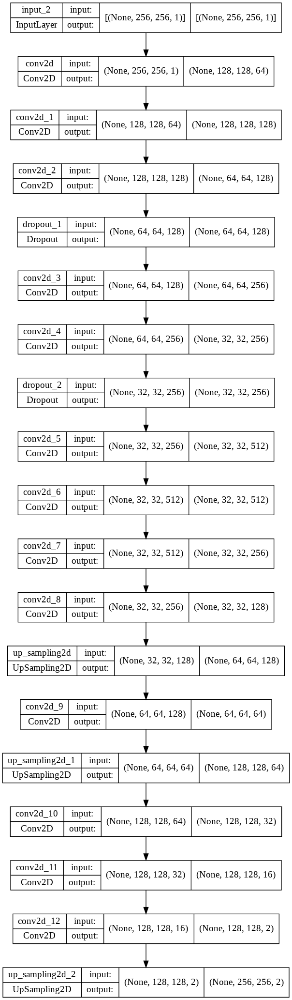

In [ ]:
plot_model(model, to_file='/content/drive/MyDrive/models/model_plot.png', show_shapes=True, show_layer_names=True)

### Train the model.

In [ ]:
epochs = 20
history = model.fit(X_train, y_train, validation_split=0.2, epochs=epochs, batch_size=10)

Epoch 1/20
156/156 [==============================] - 36s 133ms/step - loss: 0.0546 - accuracy: 0.5099 - val_loss: 0.0128 - val_accuracy: 0.4973
Epoch 2/20
156/156 [==============================] - 20s 127ms/step - loss: 0.0147 - accuracy: 0.4995 - val_loss: 0.0127 - val_accuracy: 0.4973
Epoch 3/20
156/156 [==============================] - 19s 121ms/step - loss: 0.0121 - accuracy: 0.4931 - val_loss: 0.0128 - val_accuracy: 0.4972
Epoch 4/20
156/156 [==============================] - 19s 122ms/step - loss: 0.0176 - accuracy: 0.5203 - val_loss: 0.0116 - val_accuracy: 0.6550
Epoch 5/20
156/156 [==============================] - 20s 130ms/step - loss: 0.0147 - accuracy: 0.5935 - val_loss: 0.0116 - val_accuracy: 0.6337
Epoch 6/20
156/156 [==============================] - 19s 125ms/step - loss: 0.0114 - accuracy: 0.5802 - val_loss: 0.0113 - val_accuracy: 0.6567
Epoch 7/20
156/156 [==============================] - 21s 132ms/step - loss: 0.0110 - accuracy: 0.6027 - val_loss: 0.0113 - val_ac

OPTIONAL: Save the trained model to a pickle file.

In [ ]:
model_path = '/content/drive/MyDrive/models/' 
pickle.dump(model, open(model_path + 'baseline_model' + '_e' + str(epochs) + '.sav', 'wb'))

Display training/validation accuracy and loss plots for the model.

In [ ]:
def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    x = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(x, acc, 'b', label='Training acc')
    plt.plot(x, val_acc, 'r', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(x, loss, 'b', label='Training loss')
    plt.plot(x, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

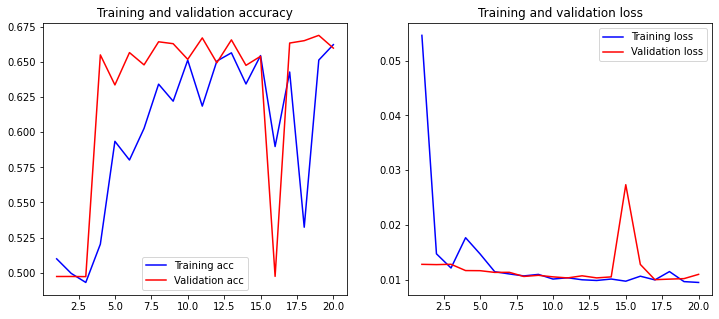

In [ ]:
plot_history(history)

### Make predictions on the testing dataset.

Evaluate the model's accuracy on the testing set.

In [ ]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))

Testing Accuracy:  0.6839


In [ ]:
# OPTIONAL: load a saved pre-trained model
# model = pickle.load(open('/content/drive/MyDrive/models/baseline_model_e50.sav' , 'rb'))

predictions = model.predict(X_test)
predictions = predictions * 128

Display colorized images and save them to a directory.

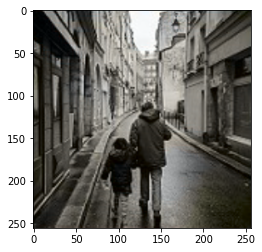

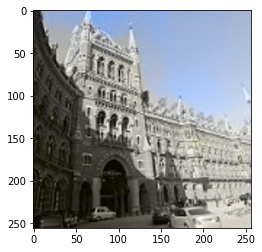

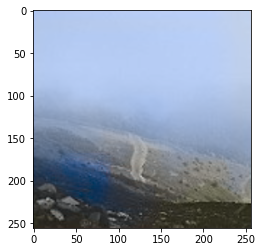

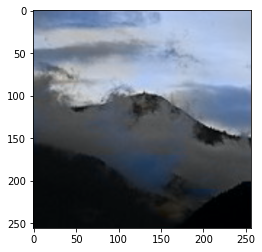

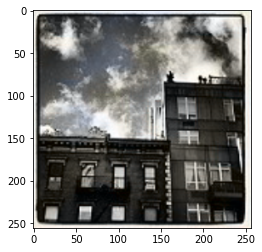

...

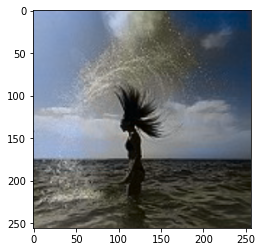

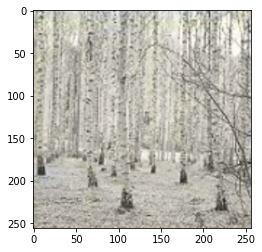

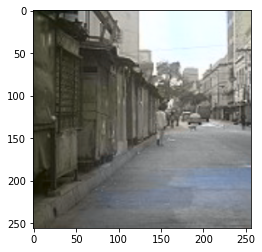

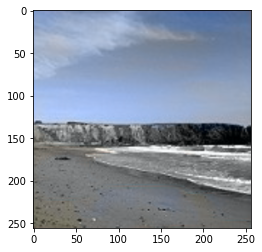

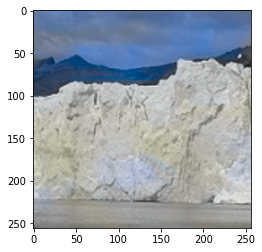

In [ ]:
save_path = '/content/drive/MyDrive/imagesBaseline/' + str(epochs) + '/'

# output colorizations
for i in range(len(predictions)):
    result = np.zeros((256, 256, 3))
    result[:,:,0] = X_test[i][:,:,0]
    result[:,:,1:] = predictions[i]
    result = lab2rgb(result)
    plt.imshow(result)
    plt.show()
    io.imsave(save_path + 'image' + str(i) + '.png', result)

## Autoencoder using pre-trained VGG-16 model.

### Define and compile the model

Because we are going to replace the encoder part with VGG16, we don’t need it as a classifier, we need it as a feature extractor so, the last dense layers isn’t needed we have to pop them up.
Here, we iterate on each layer except the last dense layers so, we add 19 layer to our model. the dimension of last layer volume is “7x7x512”. 
We will be using that latent space volume as a feature vector to be input to the decoder.
and the decoder is going to learn the mapping from the latent space vector to ab channels. 
We want the layers of VGG16 with its original weights without changing them, so that we set the trainable parameter in each layer to false because we don’t :want to train them again.

In [ ]:
vggmodel = VGG16()
newmodel = Sequential() 

for i, layer in enumerate(vggmodel.layers):
    if i<19:          # only up to 19th layer to include feature extraction only
        newmodel.add(layer)
newmodel.summary()
for layer in newmodel.layers:
    layer.trainable=False   # we don't want to train these layers again, so False. 

553476096/553467096 [==============================] - 9s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                       

In [ ]:
X =[]
Y =[]
for img in imgs:
  try:
    img = preprocess(img, 224)
    lab = rgb2lab(img)
    X.append(lab[:,:,0])
    # A and B values range from -127 to 128, 
    # so we divide the values by 128 to restrict values to between -1 and 1
    Y.append(lab[:,:,1:] / 128)  
  except:
     print('error')
X = np.array(X)
Y = np.array(Y)
X = X.reshape(X.shape + (1,))  # dimensions to be the same for X and Y
print(X.shape)
print(Y.shape)

(2000, 224, 224, 1)
(2000, 224, 224, 2)


In [ ]:
# now we have one channel of L in each layer but, VGG16 is expecting 3 dimension, 
# so we repeated the L channel two times to get 3 dimensions of the same L channel

vggfeatures = []
for i, sample in enumerate(X):
    sample = gray2rgb(sample)
    sample = sample.reshape((1,224,224,3))
    prediction = newmodel.predict(sample)
    prediction = prediction.reshape((7,7,512))
    vggfeatures.append(prediction)
vggfeatures = np.array(vggfeatures)
print(vggfeatures.shape)

(2000, 7, 7, 512)


In [ ]:
X_train, X_test_vgg, y_train, y_test_vgg = train_test_split(vggfeatures, Y, test_size=0.025, random_state=17)
X_train.shape, X_test_vgg.shape, y_train.shape, y_test_vgg.shape

((1950, 7, 7, 512), (50, 7, 7, 512), (1950, 224, 224, 2), (50, 224, 224, 2))

In [ ]:
# Decoder
model = Sequential()

model.add(Conv2D(256, (3,3), activation='relu', padding='same', input_shape=(7,7,512)))
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(64, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(16, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(2, (3, 3), activation='tanh', padding='same'))
model.add(UpSampling2D((2, 2)))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_13 (Conv2D)          (None, 7, 7, 256)         1179904   
                                                                 
 conv2d_14 (Conv2D)          (None, 7, 7, 128)         295040    
                                                                 
 up_sampling2d_3 (UpSampling  (None, 14, 14, 128)      0         
 2D)                                                             
                                                                 
 conv2d_15 (Conv2D)          (None, 14, 14, 64)        73792     
                                                                 
 up_sampling2d_4 (UpSampling  (None, 28, 28, 64)       0         
 2D)                                                             
                                                                 
 conv2d_16 (Conv2D)          (None, 28, 28, 32)       

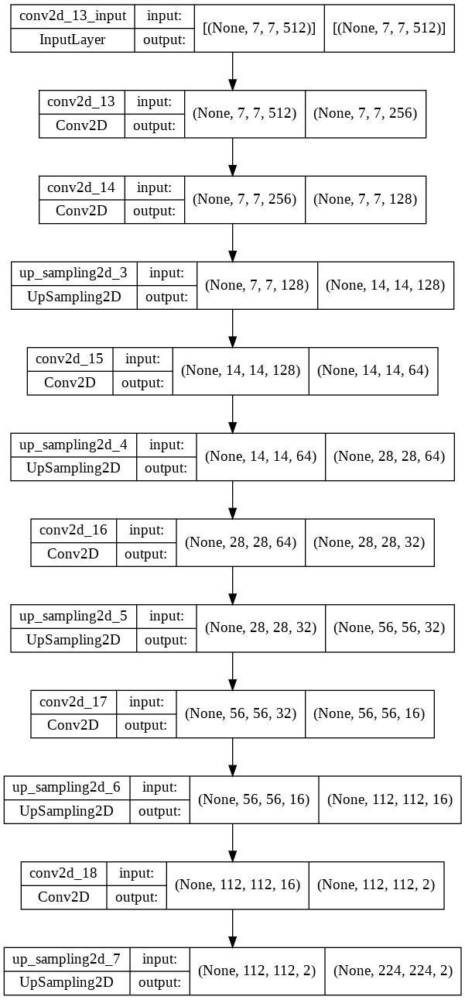

In [ ]:
plot_model(model, to_file='/content/drive/MyDrive/models/vgg_model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
model.compile(optimizer='rmsprop', loss='mse' , metrics=['accuracy'])

### Train the model

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=17)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

In [ ]:
history = model.fit(X_train, y_train, epochs = 50 , validation_split = 0.1)
# history = model.fit(X_train, y_train, epochs = 50 , validation_data = (X_val, y_val))

Epoch 1/50
55/55 [==============================] - 4s 40ms/step - loss: 0.0763 - accuracy: 0.5815 - val_loss: 0.0105 - val_accuracy: 0.5665
Epoch 2/50
55/55 [==============================] - 1s 26ms/step - loss: 0.0100 - accuracy: 0.6525 - val_loss: 0.0084 - val_accuracy: 0.6703
Epoch 3/50
55/55 [==============================] - 1s 26ms/step - loss: 0.0088 - accuracy: 0.6885 - val_loss: 0.0082 - val_accuracy: 0.6763
Epoch 4/50
55/55 [==============================] - 1s 27ms/step - loss: 0.0081 - accuracy: 0.7054 - val_loss: 0.0088 - val_accuracy: 0.6695
Epoch 5/50
55/55 [==============================] - 1s 27ms/step - loss: 0.0072 - accuracy: 0.7206 - val_loss: 0.0082 - val_accuracy: 0.6632
Epoch 6/50
55/55 [==============================] - 2s 28ms/step - loss: 0.0065 - accuracy: 0.7276 - val_loss: 0.0078 - val_accuracy: 0.6732
Epoch 7/50
55/55 [==============================] - 1s 26ms/step - loss: 0.0058 - accuracy: 0.7410 - val_loss: 0.0077 - val_accuracy: 0.6716
Epoch 8/50
55

In [ ]:
#Save model
from google.colab import drive
drive.mount('/content/gdrive')

model_save_name = 'vgg_L_50_epochs_rmsprop.pt'
model_path = F"/content/gdrive/My Drive/NN_project_vgg/{model_save_name}"
model.save(model_path)

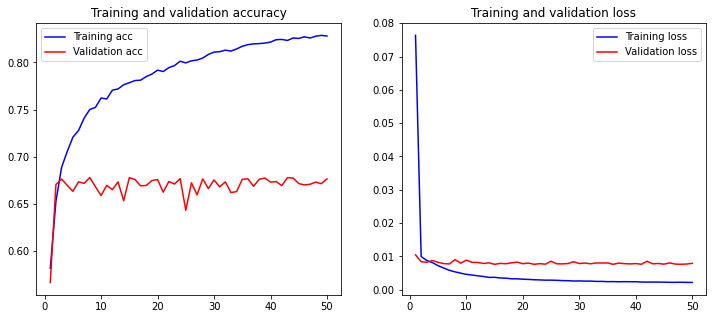

In [ ]:
plot_history(history)

### Make predictions on the test dataset

In [ ]:
loss, accuracy = model.evaluate(X_test_vgg, y_test_vgg, batch_size=1)
print("Testing Accuracy:  {:.4f}".format(accuracy))

50/50 [==============================] - 0s 4ms/step - loss: 0.0075 - accuracy: 0.6789
Testing Accuracy:  0.6789


The change in post-processing section is that you are going to use two models instead of one, the first model is the VGG16 pre-trained model to extract the features and use these features to predict with the second model “the decoder” that you used to train your data.

In [ ]:
# Test model
output = model.predict(X_test_vgg)
output = output * 128
print(output.shape)
print(len(output))
print(len(X_test_vgg))

(50, 224, 224, 2)
50
50


In [ ]:
X_train_novgg, X_test_novgg, y_train_novgg, y_test_novgg = train_test_split(X, Y, test_size=0.025, random_state=17)
X_train_novgg.shape, X_test_novgg.shape, y_train_novgg.shape, y_test_novgg.shape

((1950, 224, 224, 1),
 (50, 224, 224, 1),
 (1950, 224, 224, 2),
 (50, 224, 224, 2))

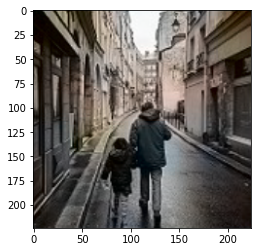

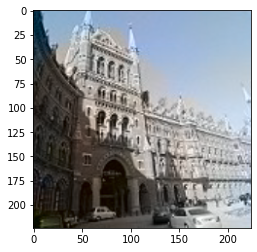

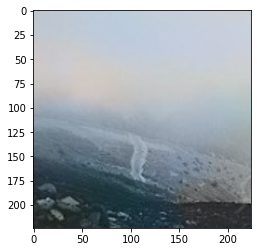

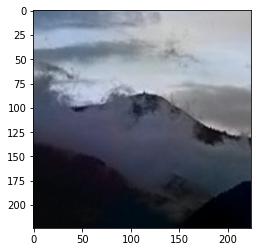

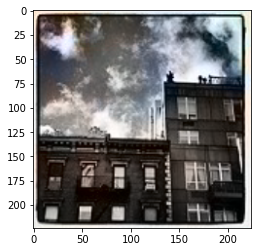

...

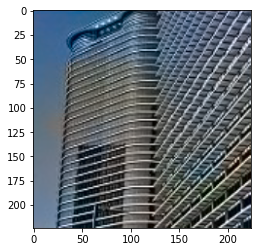

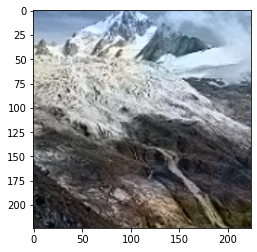

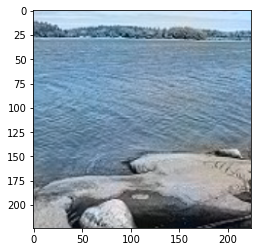

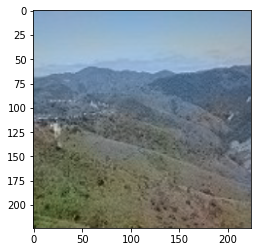

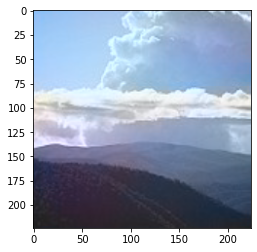

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


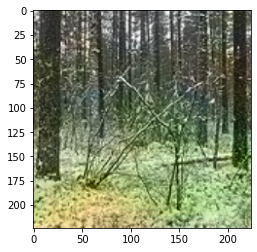

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 2 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


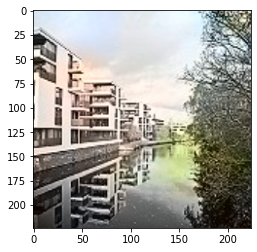

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 41 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


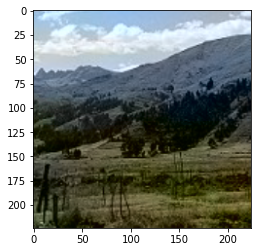

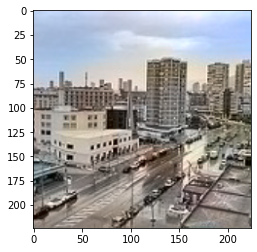

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 388 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


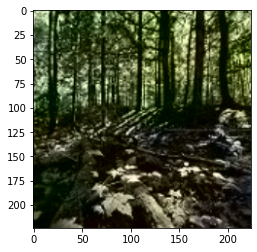

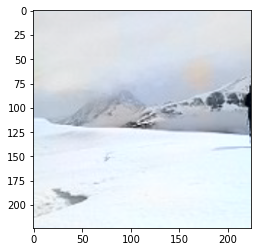

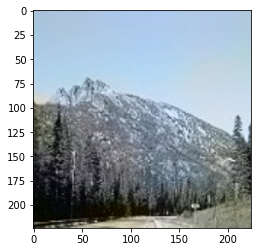

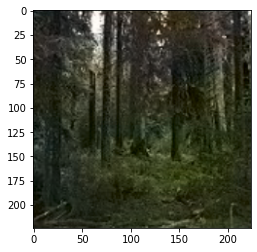

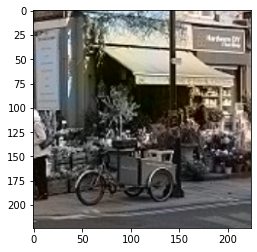

...

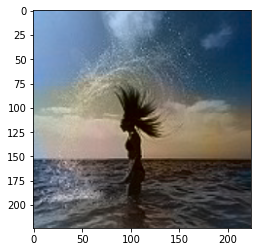

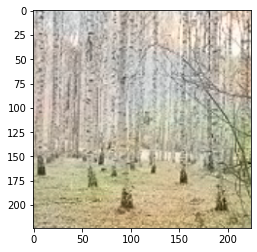

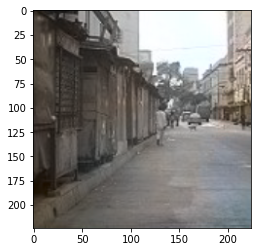

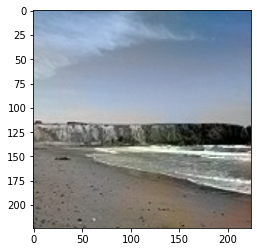

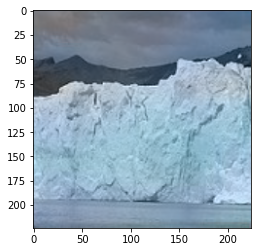

In [ ]:
results = []
for i in range(len(output)):
    result = np.zeros((224, 224, 3))
    result[:,:,0] = X_test_novgg[i][:,:,0]
    result[:,:,1:] = output[i]
    result = lab2rgb(result)
    results.append(result)
    plt.imshow(result)
    plt.show()
    io.imsave("/content/gdrive/My Drive/NN_project_vgg/50_epochs_rmsprop/vgg16_50_epochs_"+str(i)+".png", result)